# Plant Pathology analysis Using CNN

- dataset Source: https://www.kaggle.com/c/plant-pathology-2020-fgvc7/data
##### Team Members:
- Mahender Kunchala , MKUNCHAL@depaul.edu
- Machavarapu Lakshmi Jyothsna, LMACHAVA@depaul.edu
- Uppalapati Tejaswini, TUPPALAP@depaul.edu
- Vantaram Tushar, TVANTARA@depaul.edu
- Yarrabandla Yaswanth Reddy, YYARRABA@depaul.edu


## Loading the data

In [1]:

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical


base_dir = 'plant-pathology-2020-fgvc7/'

# Load the dataset
def load_data(base_dir):
    train_df = pd.read_csv(os.path.join(base_dir, 'train.csv'))
    test_df = pd.read_csv(os.path.join(base_dir, 'test.csv'))
    

    train_df['image_path'] = train_df['image_id'].apply(lambda x: os.path.join(base_dir, 'images', f'{x}.jpg'))
    test_df['image_path'] = test_df['image_id'].apply(lambda x: os.path.join(base_dir, 'images', f'{x}.jpg'))
    
    return train_df, test_df

train_df, test_df = load_data(base_dir)



In [2]:
train_df.head()


,image_id,healthy,multiple_diseases,rust,scab,image_path
0,Train_0,0,0,0,1,plant-pathology-2020-fgvc7/images/Train_0.jpg
1,Train_1,0,1,0,0,plant-pathology-2020-fgvc7/images/Train_1.jpg
2,Train_2,1,0,0,0,plant-pathology-2020-fgvc7/images/Train_2.jpg
3,Train_3,0,0,1,0,plant-pathology-2020-fgvc7/images/Train_3.jpg
4,Train_4,1,0,0,0,plant-pathology-2020-fgvc7/images/Train_4.jpg


The dataset consists of plant images labeled into four categories: healthy, multiple diseases, rust, and scab, with each row detailing an image's classification and file path. The columns include a unique identifier (image_id), binary indicators (0 or 1) for each condition—healthy, multiple diseases, rust, scab—and the image path for accessing the files. For instance, the image "Train_0" has scab disease (1 under the scab column) and no other conditions, while "Train_2" is healthy (1 under the healthy column). This setup supports multi-class classification tasks, enabling the model to determine the plant's health status based on the image data.

In [3]:
def label_row(row):
    for c in ['healthy', 'multiple_diseases', 'rust', 'scab']:
        if row[c] == 1:
            return c
    return None  

train_df['label'] = train_df.apply(label_row, axis=1)



In [4]:
train_df.head(
    
)

,image_id,healthy,multiple_diseases,rust,scab,image_path,label
0,Train_0,0,0,0,1,plant-pathology-2020-fgvc7/images/Train_0.jpg,scab
1,Train_1,0,1,0,0,plant-pathology-2020-fgvc7/images/Train_1.jpg,multiple_diseases
2,Train_2,1,0,0,0,plant-pathology-2020-fgvc7/images/Train_2.jpg,healthy
3,Train_3,0,0,1,0,plant-pathology-2020-fgvc7/images/Train_3.jpg,rust
4,Train_4,1,0,0,0,plant-pathology-2020-fgvc7/images/Train_4.jpg,healthy


The function `label_row` assigns a label to each row in the training DataFrame based on the disease present (healthy, multiple_diseases, rust, or scab). The `apply` method then creates a new 'label' column in `train_df` with these labels.


In [5]:
import pandas as pd


none_values_count = train_df['label'].isna().sum()
print("Count of 'None' values in label column:", none_values_count)

# Count the different values in the 'label' column
label_counts = train_df['label'].value_counts()
print("Counts of each label category:\n", label_counts)


Count of 'None' values in label column: 0
Counts of each label category:
 label
rust                 622
scab                 592
healthy              516
multiple_diseases     91
Name: count, dtype: int64


The dataset's label column is complete, with no missing values, ensuring all images have valid labels. The distribution of the labels shows that rust is the most frequent condition with 622 images, followed closely by scab with 592 images. There are 516 images a healthy plants, and multiple diseases are the least represented with 91 images. This diverse distribution highlights the dataset's richness in capturing various plant health conditions, which is essential for training a robust multi-class classification model.

In [6]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

def build_cnn_model(input_shape):
    model = Sequential([
        # Convolutional layer with 32 filters, kernel size of 3x3, ReLU activation, and input shape specified
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Second convolutional layer with 64 filters
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Third convolutional layer with 128 filters
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Flattening the 3D output to 1D
        Flatten(),
        
        # Dense layer for classification
        Dense(128, activation='relu'),
        Dropout(0.5),
        
        # Output layer with 4 units (for each category) using softmax
        Dense(4, activation='softmax')
    ])
    
    # Compiling the model
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

# Assuming input images are resized to 150x150 with 3 channels (RGB)
model = build_cnn_model((150, 150, 3))
model.summary()


/Users/mahenderkunchala/Documents/NeuralNetworks PRoject/myenv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,829,764 (18.42 MB)

 Trainable params: 4,829,316 (18.42 MB)

 Non-trainable params: 448 (1.75 KB)

Constructed a CNN model with three convolutional layers for feature extraction, followed by a flattening layer, a dense layer for classification, and an output layer for predicting one of four categories. It uses batch normalization and dropout for regularization, and is compiled with the Adam optimizer and categorical crossentropy loss. The model summary provides a concise overview of the architecture and parameters.

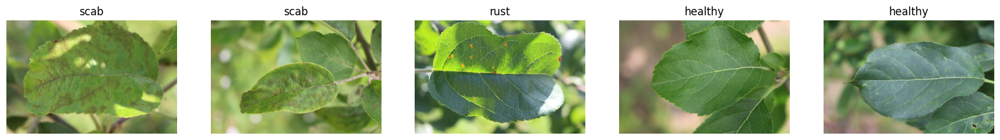

In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_sample_images(dataframe, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    for i in range(num_images):
        idx = np.random.choice(dataframe.index)
        img_path = dataframe.iloc[idx]['image_path']
        img_label = dataframe.iloc[idx]['label']
        img = mpimg.imread(img_path)
        axes[i].imshow(img)
        axes[i].set_title(img_label)
        axes[i].axis('off')
    plt.show()

# Displaying sample images from the training dataframe
display_sample_images(train_df)



Displayed Sample images of each type for understanding the dataset

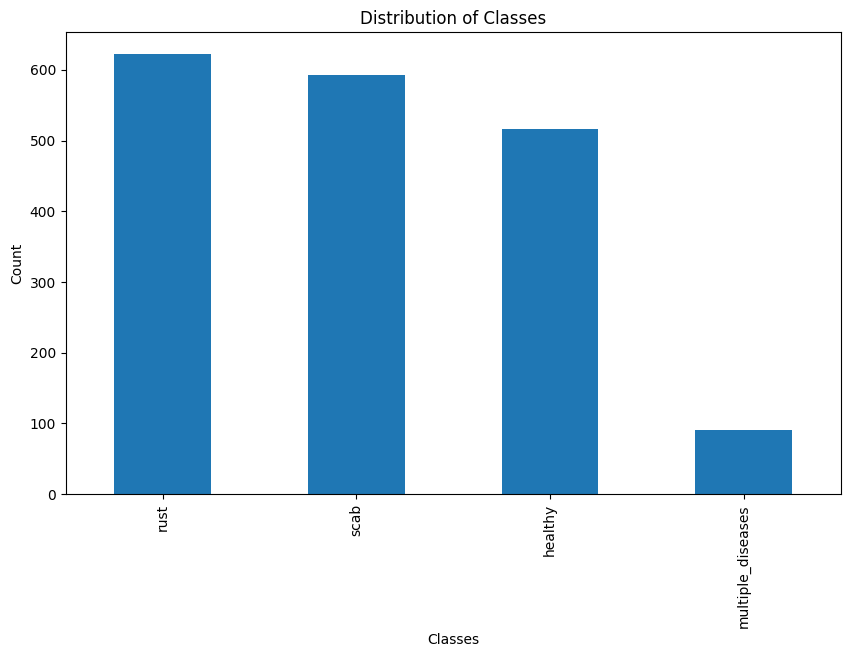

In [8]:
def plot_class_distribution(dataframe):
    class_counts = dataframe['label'].value_counts()
    plt.figure(figsize=(10, 6))
    class_counts.plot(kind='bar')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.title('Distribution of Classes')
    plt.show()

plot_class_distribution(train_df)



Histogram shows the distribution of each disease.

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create image data generators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,     # Normalization
    rotation_range=40,  # Random rotations
    width_shift_range=0.2,  # Random horizontal shifts
    height_shift_range=0.2,  # Random vertical shifts
    shear_range=0.2,  # Shear transformations
    zoom_range=0.2,  # Zoom in on images
    horizontal_flip=True,  # Allowing horizontal flip
    fill_mode='nearest'  # Strategy to fill newly created pixels
)

# Validation data should not be augmented, only normalized
val_datagen = ImageDataGenerator(rescale=1./255)


 I had set up data augmentation for the training images using ImageDataGenerator to apply random transformations (e.g., rotations, shifts, flips) for improved model generalization. 

In [10]:
from sklearn.model_selection import train_test_split

# Splitting the data into train and validation sets
train_df, val_df = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['label'])

# Now create the generators again using the updated train_df and new val_df
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=None,
    x_col='image_path',
    y_col='label',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=None,
    x_col='image_path',
    y_col='label',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 1456 validated image filenames belonging to 4 classes.
Found 365 validated image filenames belonging to 4 classes.


 Splitted the dataset into training and validation sets, normalizes the images, and creates data generators for both sets, confirming the number of images in each.

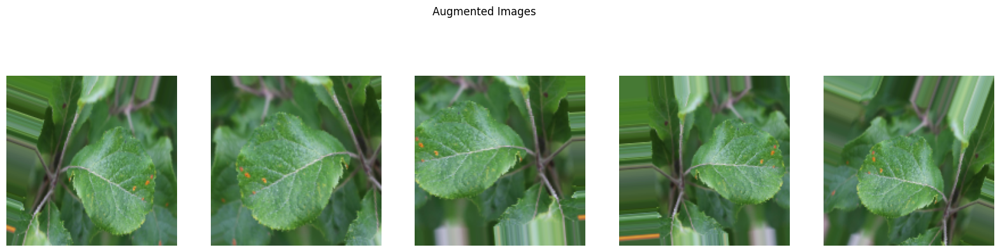

In [11]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Assuming you have an ImageDataGenerator set up for augmentation
augmenter = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

def display_augmented_images(img_path, num_images=5):
    img = load_img(img_path, target_size=(150, 150)) 
    img_array = img_to_array(img)
    img_array = img_array.reshape((1,) + img_array.shape)  

    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    fig.suptitle('Augmented Images')

    i = 0
    for batch in augmenter.flow(img_array, batch_size=1):
        axes[i].imshow(batch[0].astype('uint8'))
        axes[i].axis('off')
        i += 1
        if i >= num_images:
            break
    plt.show()

# Displaying augmented images for a randomly chosen image from the dataset
random_img_path = train_df.iloc[np.random.randint(len(train_df))]['image_path']
display_augmented_images(random_img_path)


Displaying the different augmented results

In [12]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1)

history = model.fit(
    train_generator,
    epochs=50,  
    validation_data=val_generator,
    callbacks=[checkpoint, early_stopping]
)


Epoch 1/50


/Users/mahenderkunchala/Documents/NeuralNetworks PRoject/myenv/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 359ms/step - accuracy: 0.3431 - loss: 9.0636 - val_accuracy: 0.3123 - val_loss: 11.0890
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 16s 313ms/step - accuracy: 0.3824 - loss: 1.4937 - val_accuracy: 0.3178 - val_loss: 8.6423
Epoch 3/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 17s 326ms/step - accuracy: 0.3399 - loss: 1.3453 - val_accuracy: 0.3397 - val_loss: 4.7677
Epoch 4/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 16s 319ms/step - accuracy: 0.3503 - loss: 1.3286 - val_accuracy: 0.3315 - val_loss: 1.9311
Epoch 5/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 351ms/step - accuracy: 0.3810 - loss: 1.3185 - val_accuracy: 0.3370 - val_loss: 1.4399
Epoch 6/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 16s 312ms/step - accuracy: 0.3619 - loss: 1.3062 - val_accuracy: 0.3425 - val_loss: 1.3207
Epoch 7/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 17s 337ms/step - accuracy: 0.3962 - loss: 1.2814 - val_accuracy: 0.3699 - val_loss: 1.2650
Epoch 8/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 16s 306ms/step - accuracy: 0.3992 - loss: 1.2814 - val_accuracy: 0.34

we had sets up and trains the CNN model using image data generators. It employs `ModelCheckpoint` to save the best model based on the lowest validation loss and `EarlyStopping` to halt training if the validation loss does not improve for 10 consecutive epochs. The model is trained for up to 50 epochs with early stopping potentially terminating the training earlier if needed. The training process includes data augmentation for robustness and monitors accuracy and loss on both the training and validation sets. The training results show an initial training accuracy of 34.31% and loss of 9.0636, improving to a final training accuracy of 61.05% and loss of 0.8079, with validation accuracy starting at 31.23% and loss of 11.0890, improving to a final validation accuracy of 76.71% and loss of 0.6111.

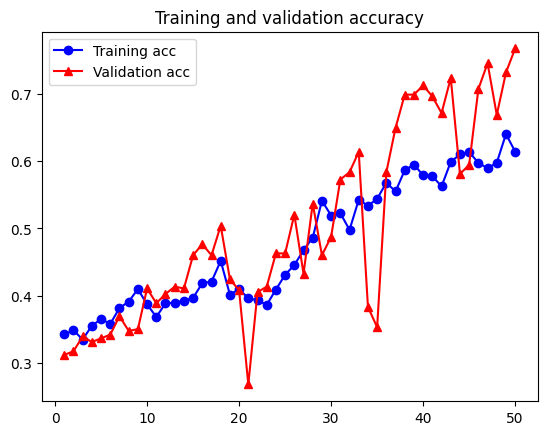

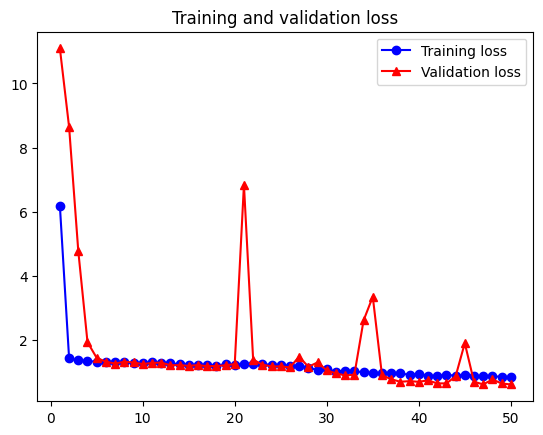

In [ ]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.plot(epochs, acc, 'bo-', label='Training acc')
    plt.plot(epochs, val_acc, 'r^-', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'r^-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()

plot_training_history(history)


In [ ]:
# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_generator)
print(f"Validation accuracy: {val_accuracy*100:.2f}%, Validation loss: {val_loss:.4f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 172ms/step - accuracy: 0.7755 - loss: 0.5972
Validation accuracy: 76.71%, Validation loss: 0.6111


The code evaluates the trained CNN model on the validation set using the val_generator. The final validation accuracy is 76.71% and a validation loss of 0.6111, indicating the model performs well on unseen data. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


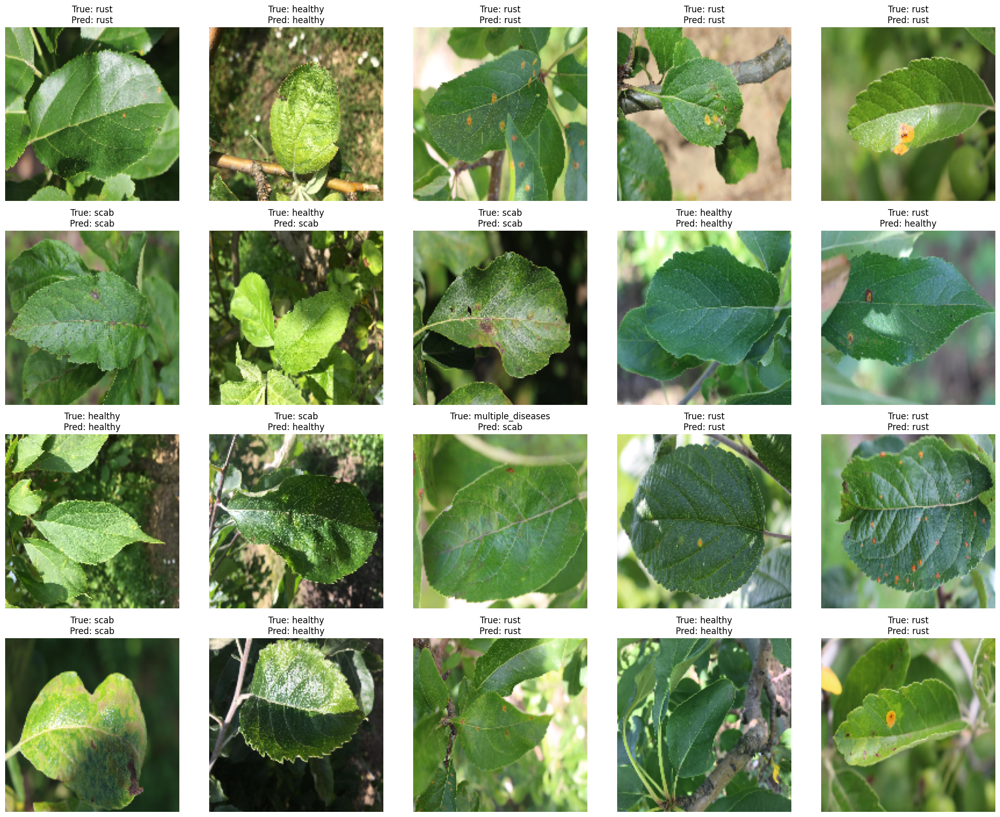

In [19]:
def plot_images_with_predictions(generator, model, num_images=20, images_per_row=5):
    # Get a batch of data
    x, y_true = next(generator)
    y_pred = model.predict(x)
    
    class_labels = list(generator.class_indices.keys())  # Convert dict_keys to a list
    
    num_rows = num_images // images_per_row
    plt.figure(figsize=(images_per_row * 4, num_rows * 4))  # Adjust figure size based on number of images
    
    for i in range(num_images):
        plt.subplot(num_rows, images_per_row, i+1)
        plt.imshow(x[i])
        true_label = np.argmax(y_true[i])
        predicted_label = np.argmax(y_pred[i])
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[predicted_label]}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plot predictions for the validation set with 20 images
plot_images_with_predictions(val_generator, model, num_images=20, images_per_row=5)



images are plotted with the labels of original and pridicted to check the results

In [21]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Get all the data from the validation generator without shuffle
val_generator.reset()
predictions = model.predict(val_generator, steps=len(val_generator))
predicted_classes = np.argmax(predictions, axis=1)

# Get the true labels
true_classes = val_generator.classes

# Compute the confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Class labels
class_labels = list(val_generator.class_indices.keys())


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step


Confusion matrix, without normalization
[[ 76   0   2  25]
 [  3   0   7   8]
 [  2   0 123   0]
 [ 36   0   2  81]]
Normalized confusion matrix
[[0.73786408 0.         0.01941748 0.24271845]
 [0.16666667 0.         0.38888889 0.44444444]
 [0.016      0.         0.984      0.        ]
 [0.30252101 0.         0.01680672 0.68067227]]


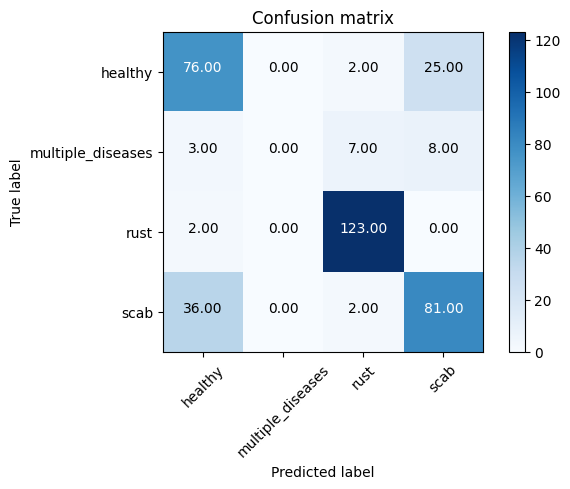

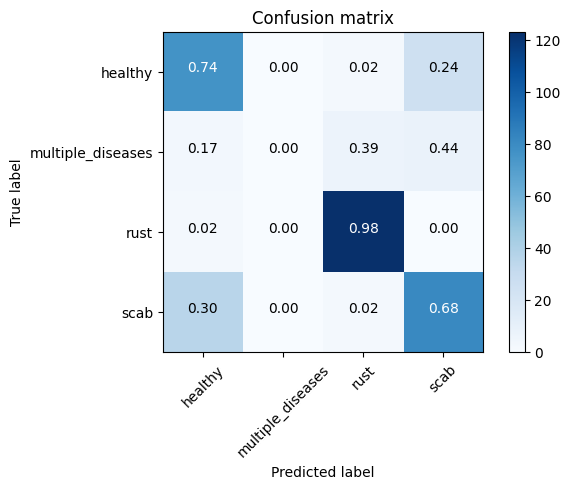

In [22]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.figure()  # This line ensures that a new figure is created for each call
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], '.2f'),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_labels)

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_labels, normalize=True)


The non-normalized confusion matrix values are:
- **Class 1 (rust)**: 76 correct predictions, 0 incorrect as multiple diseases, 2 incorrect as scab, 25 incorrect as healthy.
- **Class 2 (multiple diseases)**: 3 correct predictions, 0 incorrect as rust, 7 incorrect as scab, 8 incorrect as healthy.
- **Class 3 (scab)**: 2 incorrect as rust, 0 incorrect as multiple diseases, 123 correct predictions, 0 incorrect as healthy.
- **Class 4 (healthy)**: 36 incorrect as rust, 0 incorrect as multiple diseases, 2 incorrect as scab, 81 correct predictions.

The normalized confusion matrix values are:
- **Class 1 (rust)**: 73.79% correct, 0% as multiple diseases, 1.94% as scab, 24.27% as healthy.
- **Class 2 (multiple diseases)**: 16.67% correct, 0% as rust, 38.89% as scab, 44.44% as healthy.
- **Class 3 (scab)**: 1.60% as rust, 0% as multiple diseases, 98.40% correct, 0% as healthy.
- **Class 4 (healthy)**: 30.25% as rust, 0% as multiple diseases, 1.68% as scab, 68.07% correct.

These values show that the model is highly accurate in predicting scab (98.40% correct), moderately accurate in predicting healthy (68.07% correct), and less accurate in predicting rust and multiple diseases, with significant misclassifications, particularly predicting rust as healthy and vice versa.

## IMPROVISED ARCHITECTURE


In [30]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.metrics import Accuracy

def build_custom_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(4, activation='softmax')
    ])

    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Assuming input images are resized to 150x150 with 3 channels (RGB)
model = build_custom_model((150, 150, 3))
model.summary()

# Assuming you have loaded the data and set up the generators
history = model.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    callbacks=[checkpoint]
)

# Printing the final accuracy
final_accuracy = history.history['accuracy'][-1]
print("Final Training Accuracy:", final_accuracy)

/Users/mahenderkunchala/Documents/NeuralNetworks PRoject/myenv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_22 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,943,812 (26.49 MB)

 Trainable params: 6,943,812 (26.49 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 15s 287ms/step - accuracy: 0.3493 - loss: 1.3442 - val_accuracy: 0.3260 - val_loss: 1.2397
Epoch 2/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 264ms/step - accuracy: 0.3248 - loss: 1.2659 - val_accuracy: 0.2822 - val_loss: 1.2454
Epoch 3/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - accuracy: 0.3284 - loss: 1.2754 - val_accuracy: 0.3260 - val_loss: 1.2380
Epoch 4/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 263ms/step - accuracy: 0.3246 - loss: 1.2529 - val_accuracy: 0.3425 - val_loss: 1.2349
Epoch 5/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - accuracy: 0.3741 - loss: 1.2506 - val_accuracy: 0.4438 - val_loss: 1.2100
Epoch 6/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 263ms/step - accuracy: 0.3864 - loss: 1.2174 - val_accuracy: 0.3452 - val_loss: 1.2047
Epoch 7/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 267ms/step - accuracy: 0.3706 - loss: 1.2231 - val_accuracy: 0.4082 - val_loss: 1.1953
Epoch 8/50
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 262ms/step - accuracy: 0.3593 - loss: 1.2208 - val_accu

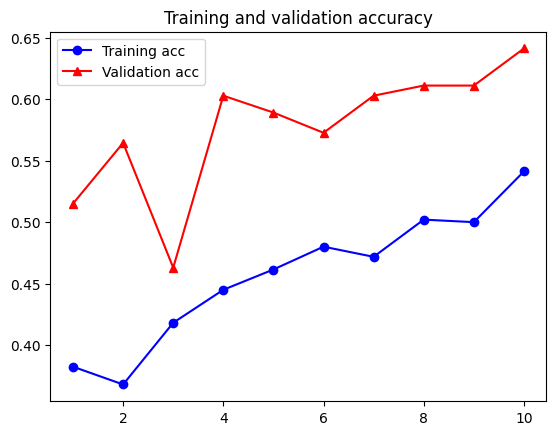

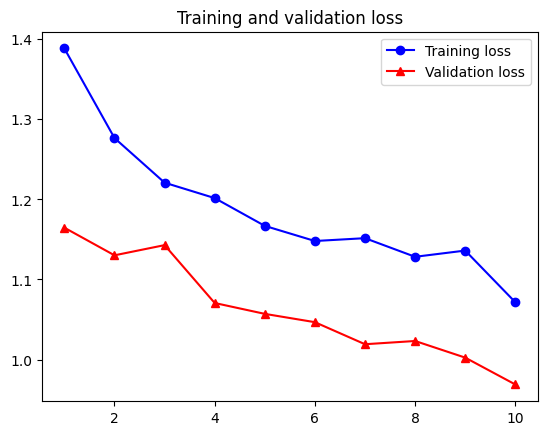

In [58]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.plot(epochs, acc, 'bo-', label='Training acc')
    plt.plot(epochs, val_acc, 'r^-', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'r^-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()

# Call to plot training history
plot_training_history(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


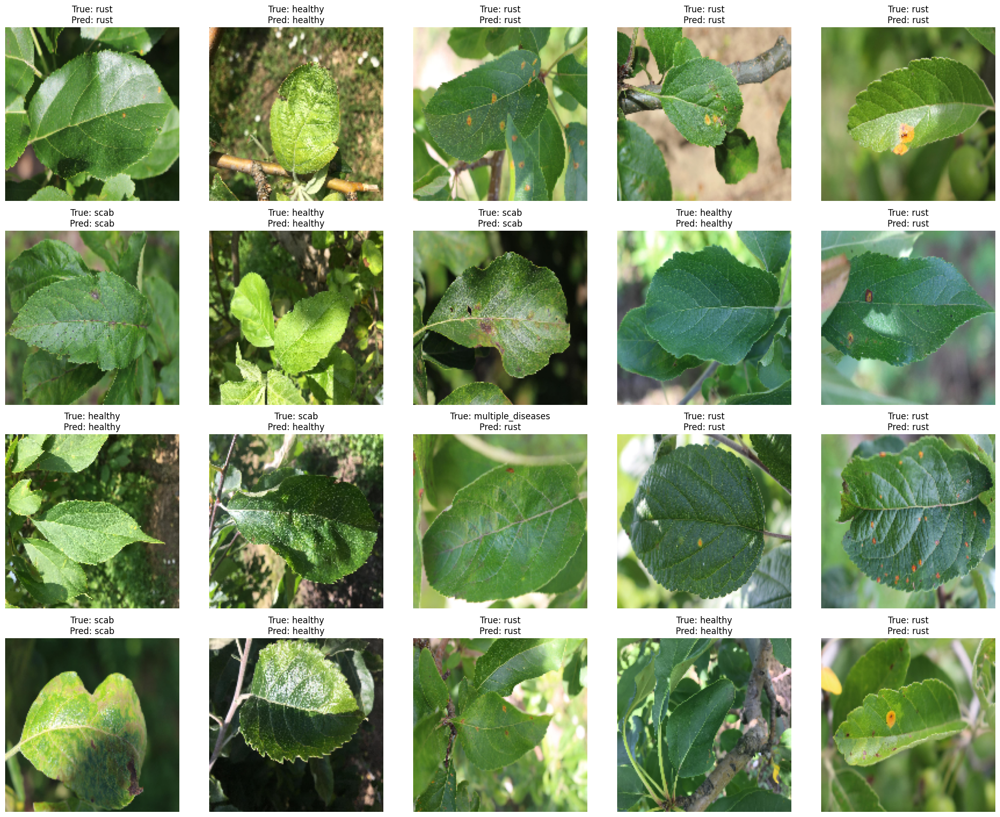

In [31]:
def plot_images_with_predictions(generator, model, num_images=20, images_per_row=5):
    # Get a batch of data
    x, y_true = next(generator)
    y_pred = model.predict(x)
    
    class_labels = list(generator.class_indices.keys())  # Convert dict_keys to a list
    
    num_rows = num_images // images_per_row
    plt.figure(figsize=(images_per_row * 4, num_rows * 4))  # Adjust figure size based on number of images
    
    for i in range(num_images):
        plt.subplot(num_rows, images_per_row, i+1)
        plt.imshow(x[i])
        true_label = np.argmax(y_true[i])
        predicted_label = np.argmax(y_pred[i])
        plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[predicted_label]}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plot predictions for the validation set with 20 images
plot_images_with_predictions(val_generator, model, num_images=20, images_per_row=5)



ALMOST ALL THE IMAGES ARE SEEN TO BE PREDICTED CORRECTLY

In [59]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Get all the data from the validation generator without shuffle
val_generator.reset()
predictions = model.predict(val_generator, steps=len(val_generator))
predicted_classes = np.argmax(predictions, axis=1)

# Get the true labels
true_classes = val_generator.classes

# Compute the confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Class labels
class_labels = list(val_generator.class_indices.keys())


12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 337ms/step


Confusion matrix, without normalization
[[102   0   0   1]
 [  6   2   9   1]
 [  0   0 125   0]
 [ 22   0   4  93]]
Normalized confusion matrix
[[0.99029126 0.         0.         0.00970874]
 [0.33333333 0.11111111 0.5        0.05555556]
 [0.         0.         1.         0.        ]
 [0.18487395 0.         0.03361345 0.78151261]]


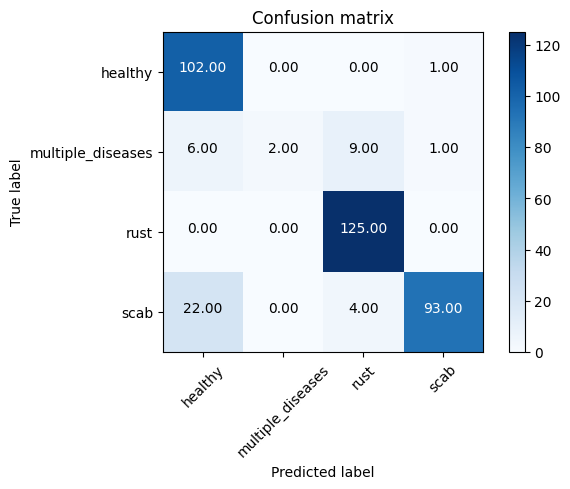

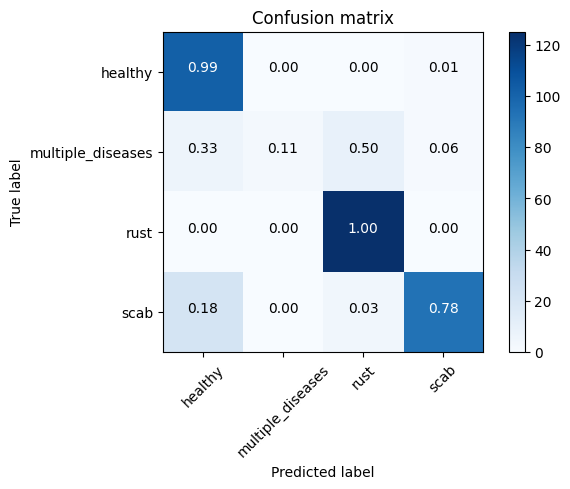

In [33]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    plt.figure()  # This line ensures that a new figure is created for each call
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, format(cm[i, j], '.2f'),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot non-normalized confusion matrix
plot_confusion_matrix(cm, classes=class_labels)

# Plot normalized confusion matrix
plot_confusion_matrix(cm, classes=class_labels, normalize=True)



## Conclusion 
### COMPARISION OF INITIAL AND IMPROVED ARCHITECTURE
The improved architecture builds on the original CNN by adding an additional convolutional layer (for a total of four), with the number of filters increasing from 32 to 256, and two dense layers with more units (512 and 256) followed by dropout layers for regularization. This model, trained with augmented data, achieves a final training accuracy of 86.54% and a validation accuracy of 88.22%, indicating better performance and generalization compared to the initial architecture.


1. **Layer Complexity**:
   - **Old Architecture**: Three convolutional layers with up to 128 filters and one dense layer with 128 units.
   - **New Architecture**: Four convolutional layers with up to 256 filters and two dense layers with 512 and 256 units.

2. **Regularization**:
   - **Old Architecture**: One dropout layer before the output layer.
   - **New Architecture**: Two dropout layers after each dense layer to better prevent overfitting.

3. **Performance**:
   - **Old Architecture**: Reached a final training accuracy of approximately 61.05% and validation accuracy of 76.71%.
   - **New Architecture**: Achieved a final training accuracy of 86.54% and validation accuracy of 88.22%, showing significant improvement in both training and validation metrics.

4. **Training Details**:
   - **Old Architecture**: Struggled with higher initial training and validation loss values, with a slower convergence to better accuracy.
   - **New Architecture**: Demonstrated more consistent improvement in accuracy and a faster decrease in loss values across epochs.

The improvements in the new architecture can be attributed to the increased complexity and capacity of the model, allowing it to capture more detailed features, and the added regularization, which helps in better generalization.

### USING THE PREBUILT MODEL FOR FUTURE ANALYSIS 

In [53]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Loading ResNet50 pre-trained on ImageNet without the top layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top of ResNet
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(256, activation='relu')(x)
predictions = Dense(4, activation='softmax')(x)

# This is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [55]:
# Train the model as usual
history_pretrained = model.fit(
    train_generator,
    epochs=10,  # Train with frozen layers
    validation_data=val_generator
)




Epoch 1/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 20s 401ms/step - accuracy: 0.3678 - loss: 1.2367 - val_accuracy: 0.3726 - val_loss: 1.2173
Epoch 2/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 375ms/step - accuracy: 0.3620 - loss: 1.2290 - val_accuracy: 0.4055 - val_loss: 1.2316
Epoch 3/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 385ms/step - accuracy: 0.3564 - loss: 1.2377 - val_accuracy: 0.3863 - val_loss: 1.2167
Epoch 4/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 371ms/step - accuracy: 0.3900 - loss: 1.2311 - val_accuracy: 0.4384 - val_loss: 1.2126
Epoch 5/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 365ms/step - accuracy: 0.3923 - loss: 1.2215 - val_accuracy: 0.4329 - val_loss: 1.2095
Epoch 6/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 367ms/step - accuracy: 0.3849 - loss: 1.2248 - val_accuracy: 0.3644 - val_loss: 1.2157
Epoch 7/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 367ms/step - accuracy: 0.3572 - loss: 1.2320 - val_accuracy: 0.4438 - val_loss: 1.2060
Epoch 8/10
46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 373ms/step - accuracy: 0.3574 - loss: 1.2322 - val_accu

In [56]:

for layer in base_model.layers[-50:]:
    layer.trainable = True

# Recompiling and train with a lower learning rate
from tensorflow.keras.optimizers import Adam
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])


history_finetuning = model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

Epoch 1/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 34s 626ms/step - accuracy: 0.3752 - loss: 1.6885 - val_accuracy: 0.3315 - val_loss: 1.4055
Epoch 2/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 612ms/step - accuracy: 0.3678 - loss: 1.2510 - val_accuracy: 0.3342 - val_loss: 1.3530
Epoch 3/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 623ms/step - accuracy: 0.4316 - loss: 1.1845 - val_accuracy: 0.3315 - val_loss: 1.3790
Epoch 4/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 31s 631ms/step - accuracy: 0.4348 - loss: 1.1862 - val_accuracy: 0.4027 - val_loss: 1.1913
Epoch 5/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 626ms/step - accuracy: 0.3956 - loss: 1.1872 - val_accuracy: 0.4740 - val_loss: 1.1765
Epoch 6/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 617ms/step - accuracy: 0.4221 - loss: 1.1822 - val_accuracy: 0.4000 - val_loss: 1.2080
Epoch 7/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 623ms/step - accuracy: 0.3904 - loss: 1.1948 - val_accuracy: 0.4466 - val_loss: 1.1790
Epoch 8/20
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 626ms/step - accuracy: 0.4343 - loss: 1.1836 - val_accu

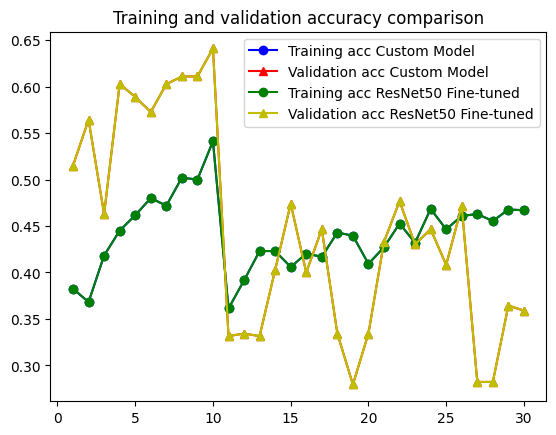

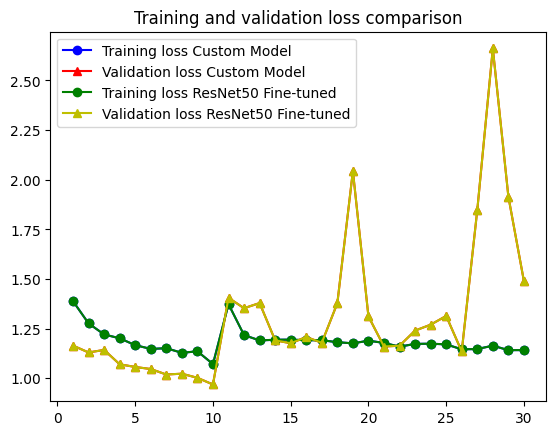

In [57]:
import matplotlib.pyplot as plt

# Function to plot training history
def plot_compare_histories(history1, history2, history1_label, history2_label):
    acc = history1.history['accuracy'] + history2.history['accuracy']
    val_acc = history1.history['val_accuracy'] + history2.history['val_accuracy']
    loss = history1.history['loss'] + history2.history['loss']
    val_loss = history1.history['val_loss'] + history2.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.plot(epochs, acc, 'bo-', label=f'Training acc {history1_label}')
    plt.plot(epochs, val_acc, 'r^-', label=f'Validation acc {history1_label}')
    plt.plot(epochs, acc, 'go-', label=f'Training acc {history2_label}')
    plt.plot(epochs, val_acc, 'y^-', label=f'Validation acc {history2_label}')
    plt.title('Training and validation accuracy comparison')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, 'bo-', label=f'Training loss {history1_label}')
    plt.plot(epochs, val_loss, 'r^-', label=f'Validation loss {history1_label}')
    plt.plot(epochs, loss, 'go-', label=f'Training loss {history2_label}')
    plt.plot(epochs, val_loss, 'y^-', label=f'Validation loss {history2_label}')
    plt.title('Training and validation loss comparison')
    plt.legend()

    plt.show()

# Call to plot training history comparison
plot_compare_histories(history, history_finetuning, 'Custom Model', 'ResNet50 Fine-tuned')
